<img src="../assets/change_faces.gif" style="float:right ; margin: 10px ; width:300px;"> 

<h1><left>Using Natural Language Processing to identify suicidal posts</left></h1>
<h4><left>by Ziyi Zhu</left></h4>

___

## **2. Data Cleaning, Pre-processing and EDA**
Now that we have obtained our data, we will take our first looks into it, seeking out missing values and choosing which parts of the data set will be useful for our classifier. We will also begin pre-processing the text data with natuaral language tools. This section concludes with some exploratory data analysis and visualisations.

In [2]:
#IMPORTING LIBRARIES:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 100)
sns.set_style("darkgrid")

from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import re

from sklearn.feature_extraction.text import CountVectorizer

In [3]:
# IF YOU ARE MISSING "WordCloud":
# TRY INSTALLING VIA TERMINAL LIKE THIS: /anaconda3/bin/python -m pip install wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
# IF YOU ARE MISSING "wordninja":
# TRY INSTALLING VIA TERMINAL LIKE THIS: pip install wordninja
import wordninja

In [6]:
%matplotlib inline
import scattertext as st
import re, io
from pprint import pprint
from scipy.stats import rankdata, hmean, norm
import spacy
import os, pkgutil, json, urllib
from urllib.request import urlopen
from IPython.display import IFrame
from IPython.core.display import display, HTML
from scattertext import CorpusFromPandas, produce_scattertext_explorer
display(HTML("<style>.container { width:98% !important; }</style>"))

### 2.1 Data Cleaning 

> **Cutting down the dataset** - As both sets have 100 columns, it'll be wise to choose a few columns that will be useful as our predictors. 

> **Concatenation** - As we have already created a "is_suicide" column indicating which subreddit the posts are from, we should concatenate both datasets together. 

> **Imputation** - If there are missing values, we should find a way to impute the data. 

In [7]:
#IMPORTING CSV FILES
depression = pd.read_csv('../data/depression.csv')
suicide_watch = pd.read_csv('../data/suicide_watch.csv')

In [8]:
#PEEKING INTO THE DEPRESSION DATA SET
pd.set_option('display.max_columns', 500)
depression.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,author_cakeday,is_suicide
0,NaN,depression,We understand that most people who reply immed...,t2_1t70,False,NaN,1,False,Our most-broken and least-understood rules is ...,[],r/depression,False,0.0,NaN,0,NaN,False,t3_doqwow,False,dark,1.00,NaN,public,2322,42,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,2322,NaN,True,NaN,False,NaN,[],"{'gid_1': 1, 'gid_2': 1}",NaN,True,NaN,1.572390e+09,text,0.0,NaN,NaN,text,self.depression,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,True,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,False,False,False,NaN,[],False,NaN,NaN,moderator,t5_2qqqf,NaN,NaN,NaN,doqwow,True,NaN,SQLwitch,NaN,175,True,no_ads,False,[],False,NaN,/r/depression/comments/doqwow/our_mostbroken_a...,no_ads,True,https://www.reddit.com/r/depression/comments/d...,701874,1.572361e+09,1,NaN,False,NaN,0
1,NaN,depression,Welcome to /r/depression's check-in post - a p...,t2_1t70,False,NaN,0,False,"Regular Check-In Post. Plus, a reminder about ...",[],r/depression,False,0.0,NaN,0,NaN,False,t3_iq10oq,False,dark,1.00,NaN,public,522,16,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,522,NaN,True,NaN,1599854110.0,NaN,[],{'gid_1': 1},NaN,True,NaN,1.599764e+09,text,0.0,NaN,NaN,text,self.depression,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,new,NaN,NaN,False,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,False,False,False,NaN,[],False,NaN,NaN,moderator,t5_2qqqf,NaN,NaN,NaN,iq10oq,True,NaN,SQLwitch,NaN,1940,False,no_ads,False,[],False,NaN,/r/depression/comments/iq10oq/regular_checkin_...,no_ads,True,https://www.reddit.com/r/depression/comments/i...,701874,1.599735e+09,0,NaN,False,NaN,0
2,NaN,depression,"my memory is SO bad. i can’t focus, i can’t co...",t2_5gsuu4va,False,NaN,0,False,I feel like years of depression has given me b...,[],r/depression,False,0.0,NaN,0,NaN,False,t3_jyo9pv,False,dark,1.00,NaN,public,647,2,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,647,NaN,True,NaN,False,NaN,[],{'gid_1': 1},NaN,True,NaN,1.606043e+09,text,0.0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,False,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,False,False,False,NaN,[],False,NaN,NaN,NaN,t5_2qqqf,NaN,NaN,NaN,jyo9pv,True,NaN,Cherrymus,NaN,51,True,no_ads,False,[],False,NaN,/r/depression/comments/jyo9pv/i_feel_like_year...,no_ads,False,https://www.reddit.com/r/depression/comments/j...,701874,1.606014e+09,0,NaN,False,NaN,0
3,NaN,depression,16f ... cant manage to make friends and get ov...,t2_4aw3lv52,False

#### Note: Choosing relevant columns

> **Title and Post** -  We felt that the text data in the both the title and the post itself can potentially serve our classifier well. 

> **Author's handle and number of comments** - The author's name and the number of comments are curve ball choices. There just might be some connection between a user's handle and his/her psyche. There also might be a connection between the number of comments made.

> **URL** - We left the URL in for reference. In case we'd want to look deeper into a particular post. 

In [9]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/depression 
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head(3)

,title,selftext,author,num_comments,is_suicide,url
0,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,175,0,https://www.reddit.com/r/depression/comments/d...
1,"Regular Check-In Post. Plus, a reminder about ...",Welcome to /r/depression's check-in post - a p...,SQLwitch,1940,0,https://www.reddit.com/r/depression/comments/i...
2,I feel like years of depression has given me b...,"my memory is SO bad. i can’t focus, i can’t co...",Cherrymus,51,0,https://www.reddit.com/r/depression/comments/j...


In [10]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/Suicide_Watch

suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head(3)

,title,selftext,author,num_comments,is_suicide,url
0,New wiki on how to avoid accidentally encourag...,We've been seeing a worrying increase in pro-s...,SQLwitch,253,1,https://www.reddit.com/r/SuicideWatch/comments...
1,Please remember that NO ACTIVISM of any kind i...,"Activism, i.e. advocating or fundraising for s...",SQLwitch,57,1,https://www.reddit.com/r/SuicideWatch/comments...
2,Suicide comforts me.,"Whenever I'm sad, I imagine myself dying. This...",JudyWilde143,37,1,https://www.reddit.com/r/SuicideWatch/comments...


In [11]:
#COMPARING SHAPES OF BOTH TABLES
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(950, 6)

In [12]:
suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(988, 6)

In [13]:
#READING A RANDOM POST FROM r/depression
print(depression["selftext"][120])
len(depression["selftext"][120])

I am in the last year of my college and still don't have any friends to whom I can talk to. I haven't talked to anyone in these 8 months of lockdown apart from some text related to the class or when they needed my help. I dint had any friends growing up too. Sometimes when I had one or two it felt one-sided. They never try to start the conversation. You know when people are talking and when replying. In my case, it was the latter one. I don't know what to do. Sometimes it feels like I can do it but then after the energy wears off it comes back to the same sucking life. The problem is I always try to talk because they have many people to talk to but for me, it's hard to find someone.   
Why cant people say what they mean. If they don't want to talk just say so, don't let anyone think that it is their fault or they are not **cool** enough.

**Life would be much easier when people say what they meant**


912

In [14]:
#READING A RANDOM POST FROM r/SuicideWatch
#I SUSPECT THE POSTS FROM r/SuicideWatch MIGHT BE SHORTER.
#MIGHT BE WORTH CHECKING OUT IN AN EDA LATER
print(suicide_watch["selftext"][120])
len(suicide_watch["selftext"][120])

I am going to therapy and I’m scared and confused. I have some questions

What can I expect during your first therapy appointment?

If they try to get me on meds can I refuse that?

How awkward is it and how do you know if your therapist is actually good?

How many sessions of therapy til I hopefully feel it’s effects?


320

### Combine Data

In [15]:
#WE'LL CONCAT THE SELECTED PARTS OF BOTH DATASETS BEFORE CLEANING IT
dep_columns = depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
sui_columns = suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
combined_data = pd.concat([dep_columns,sui_columns],axis=0, ignore_index=True)    
combined_data

,title,selftext,author,num_comments,is_suicide,url
0,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,175,0,https://www.reddit.com/r/depression/comments/d...
1,"Regular Check-In Post. Plus, a reminder about ...",Welcome to /r/depression's check-in post - a p...,SQLwitch,1940,0,https://www.reddit.com/r/depression/comments/i...
2,I feel like years of depression has given me b...,"my memory is SO bad. i can’t focus, i can’t co...",Cherrymus,51,0,https://www.reddit.com/r/depression/comments/j...
3,Is it wierd that i have imaginary friends at t...,16f ... cant manage to make friends and get ov...,raingivemychills,192,0,https://www.reddit.com/r/depression/comments/j...
4,I'm a ghost.,I do not exist. When you see me say hi to my c...,highnsad,12,0,https://www.reddit.com/r/depression/comments/j...
...,...,...,...,...,...,...
1933,no one cares,"no one has the time, everyone has something be...",godwtfisthisshit,0,1,https://www.reddit.com/r/SuicideWatch/comments...
1934,hey! just wanted to say I am fucking garbage,"""government""",eaglescousinbrownie,0,1,https://www.reddit.com/r/SuicideWatch/comments...
1935,"""Don't be sad, there's no point being sad."" TF...","So this happened a couple of days ago, and it ...",Hail20192020,11,1,https://www.reddit.com/r/SuicideWatch/comments...
1936,Urges too strong,Ive already tried and failed 4 times this year...,HuntressLoneWolf,0,1,https://www.reddit.com/r/SuicideWatch/comments...


In [16]:
#BACKING UP combined_data IN A CSV FILE
combined_data.to_csv('../data/combined_data.csv', index = False)

In [17]:
#CHECKING FOR MISSING DATA
#THERE ARE ONLY NULL VALUES IN OUR selftext COLUMN
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1938 entries, 0 to 1937
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         1938 non-null   object
 1   selftext      1865 non-null   object
 2   author        1938 non-null   object
 3   num_comments  1938 non-null   int64 
 4   is_suicide    1938 non-null   int64 
 5   url           1938 non-null   object
dtypes: int64(2), object(4)
memory usage: 91.0+ KB


In [18]:
#CHECKING OUT THE ROWS WITH MISSING selftext DATA
combined_data[combined_data["selftext"].isnull()].head(10)

,title,selftext,author,num_comments,is_suicide,url
52,I just want to lie down and never wake up,NaN,T2shinethru,2,0,https://www.reddit.com/r/depression/comments/j...
196,"I apologize, but will someone tell me somethin...",NaN,TheHippiesBar,2,0,https://www.reddit.com/r/depression/comments/j...
209,They say you should open up to people but no o...,NaN,_At0msk_,4,0,https://www.reddit.com/r/depression/comments/j...
402,Because being depressed is only romantic when ...,NaN,queenkarnage,2,0,https://www.reddit.com/r/depression/comments/j...
506,How not to overthink?,NaN,starg9617,1,0,https://www.reddit.com/r/depression/comments/j...
690,I hope I get covid &amp; it kills md,NaN,stop1117,2,0,https://www.reddit.com/r/depression/comments/j...
696,"I am bad at expressing my feelings,what should...",NaN,Intelligent_Hurry_96,1,0,https://www.reddit.com/r/depression/comments/j...
737,I’m right up to my limit - could talk about no...,NaN,Caroline11113,0,0,https://www.reddit.com/r/depression/comments/j...
746,Exhausted too many variables,NaN,ComedyTragedy01,0,0,https://www.reddit.com/r/depression/comments/j...
753,Is There Any Meaning To Life At All?,NaN,Arrataz,5,0,https://www.reddit.com/r/depression/comments/j...


In [19]:
#THE NaNs APPEAR OVERWHELMINGLY IN r/SuicideWatch POSTS (98.46%)
#IT MIGHT BE IMPORTANT TO DIG INTO THE TITLES OF THESE POSTS LATER
#WE WILL NOT DROP THESE ROWS
#DATA IMPUTATION DECISION MADE: REPLACE NaNs WITH "emptypost"
combined_data["is_suicide"][combined_data["selftext"].isnull()].value_counts()

1    57
0    16
Name: is_suicide, dtype: int64

In [20]:
#FILLING NaNs
combined_data["selftext"].fillna("emptypost",inplace=True)

In [21]:
#CHECKING IF NaNs WERE FILLED IN
combined_data[combined_data["selftext"].isin(["emptypost"])].head()

,title,selftext,author,num_comments,is_suicide,url
52,I just want to lie down and never wake up,emptypost,T2shinethru,2,0,https://www.reddit.com/r/depression/comments/j...
196,"I apologize, but will someone tell me somethin...",emptypost,TheHippiesBar,2,0,https://www.reddit.com/r/depression/comments/j...
209,They say you should open up to people but no o...,emptypost,_At0msk_,4,0,https://www.reddit.com/r/depression/comments/j...
402,Because being depressed is only romantic when ...,emptypost,queenkarnage,2,0,https://www.reddit.com/r/depression/comments/j...
506,How not to overthink?,emptypost,starg9617,1,0,https://www.reddit.com/r/depression/comments/j...


In [22]:
#DOUBLE-CHECKING
#MISSING VALUES IMPUTED
#ON TO PRE-PROCESSING...
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1938 entries, 0 to 1937
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         1938 non-null   object
 1   selftext      1938 non-null   object
 2   author        1938 non-null   object
 3   num_comments  1938 non-null   int64 
 4   is_suicide    1938 non-null   int64 
 5   url           1938 non-null   object
dtypes: int64(2), object(4)
memory usage: 91.0+ KB


### 2.2 Pre-processing
As the posts are written by different humans, they come in different forms. In order to prepare the data for our classifier, we will have to take steps to pre-process the posts. 

> **Build processing functions** - We will build a processing function that will help change the text to lowercase, remove punctuations, reduce related words down to a common base word. With this functions, we can create a seperate column for our clean data. 


In [29]:
def processing_text(series_to_process):
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(series_to_process)):
        # TOKENISED ITEM(LONG STRING) IN A LIST
        dirty_string = (series_to_process)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) #WORDS_ONLY IS A LIST THAT DOESN'T HAVE PUNCTUATION(标点)
        
        # LEMMATISE THE ITEMS IN WORDS_ONLY
        # 词形还原(Lemmatization)与词干提取(stemming)很相似, 就是去掉单词的词缀，提取单词的主干部分，通常提取后的单词会是字典中的单词
        # 不同于词干提取（stemming），提取后的单词不一定会出现在单词中。比如，单词“cars”词形还原后的单词为“car”，单词“ate”词形还原后的单词为“eat”。
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        
        # REMOVING STOP WORDS FROM THE LEMMATIZED LIST
        # 无用的单词（数据）称为停用词, 停用词是指搜索引擎已编程忽略的常用词（例如“the”，“a”，“an”，“in”）
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        
        # RETURN SEPERATED WORDS INTO LONG STRING
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [27]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\朱子仪\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [31]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\朱子仪\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [32]:
#CHECKING TO SEE NEW COLUMNS WERE ADDED
combined_data["selftext_clean"] = processing_text(combined_data["selftext"])
combined_data["title_clean"] = processing_text(combined_data["title"])
pd.set_option("display.max_colwidth", 100)
combined_data.head(8)

,title,selftext,author,num_comments,is_suicide,url,selftext_clean,title_clean
0,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",We understand that most people who reply immediately to an OP with an invitation to talk private...,SQLwitch,175,0,https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/,understand people reply immediately op invitation talk privately mean help type response usually...,broken least understood rule helper may invite private contact first resort made new wiki explain
1,"Regular Check-In Post. Plus, a reminder about the No-Activism Rule.",Welcome to /r/depression's check-in post - a place to take a moment and share what is going on a...,SQLwitch,1940,0,https://www.reddit.com/r/depression/comments/iq10oq/regular_checkin_post_plus_a_reminder_about_the/,welcome r depression check post place take moment share going accomplishment want talk standalon...,regular check post plus reminder activism rule
2,I feel like years of depression has given me brain damage,"my memory is SO bad. i can’t focus, i can’t concentrate. and throwing ADHD and anxiety in the mi...",Cherrymus,51,0,https://www.reddit.com/r/depression/comments/jyo9pv/i_feel_like_years_of_depression_has_given_me/,memory bad focus concentrate throwing adhd anxiety mix great either worst thing memory used smar...,feel like year depression ha given brain damage
3,Is it wierd that i have imaginary friends at the age of 16 (almost 17) ... i feel like the ultim...,16f ... cant manage to make friends and get overwhelmed with online friends :(.\n\nWell i have t...,raingivemychills,192,0,https://www.reddit.com/r/depression/comments/jygm7t/is_it_wierd_that_i_have_imaginary_friends_at...,16f cant manage make friend get overwhelmed online friend well teddybear lil bit taller pretend ...,wierd imaginary friend age 16 almost 17 feel like ultimate loser
4,I'm a ghost.,I do not exist. When you see me say hi to my carcass. I'll be daydreaming off somewhere in my he...,highnsad,12,0,https://www.reddit.com/r/depression/comments/jyskqq/im_a_ghost/,exist see say hi carcass daydreaming somewhere head mouth bullshit go away filled sad filled mad...,ghost
5,"i wish I could kill myself, but see the aftermath","I just want to know who would care about me. who would cry, who would attend my funeral, who wou...",cPikah,12,0,https://www.reddit.com/r/depression/comments/jyrxiq/i_wish_i_could_kill_myself_but_see_the_after...,want know would care would cry would attend funeral would even know feel like ghost everyone exc...,wish could kill see aftermath
6,I’m not doing anything with my life,I have nothing to do. I don’t have a job. I don’t have a girlfriend. I don’t have any hobbies. I...,ThrowawayEVE_,6,0,https://www.reddit.com/r/depression/comments/jyty8g/im_not_doing_anything_with_my_life/,nothing job girlfriend hobby desire libido many friend motivation anyone understands,anything life
7,It frustrates me that I'm so dissatisfied with life when nothing bad happens to me.,"I keep seeing posts on r/insaneparents or r/depressio about real issues that people are having, ...",1-00PFm,3,0,https://www.reddit.com/r/depression/comments/jyt5ek/it_frustrates_me_that_im_so_dissatisfied_with/,keep seeing post r insaneparents r depressio real issue people comment like yeah dad sends text ...,frustrates dissatisfied life nothing bad happens


In [33]:
#CHECKING ON selftext_clean
pd.set_option("display.max_colwidth", 1000)
combined_data[["selftext","selftext_clean"]].head(2)

,selftext,selftext_clean
0,"We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",understand people reply immediately op invitation talk privately mean help type response usually lead either disappointment disaster usually work quite differently say pm anytime casual social context huge admiration appreciation goodwill good citizenship many support others flag inappropriate content even know many struggling hard work behind scene information resource make easier give get quality help small start new wiki page explains detail much better respond public comment least gotten know someone maintained r depression wiki private_contact full text current version summary anyone acting helper invite accepts private contact e pm chat kind offsite communication early conversion showing either bad intention bad judgement either way unwise trust pm anytime seems like kind generous offer might perfectly well meaning unless solid rapport ha established wise idea point consider offer accept invitation communicate privately posting supportive reply publicly help people op respons...
1,"Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\nWe try our best to keep this space as safe and supportive as possible on reddit's wide-open anonymity-friendly platform. The community rules can be found in the sidebar, or under ""Community Info"" in the official mobile apps. If you aren't sure about a rule, please ask us. \n\n********\n\nPlease keep in mind that no activism, i.e. advocating or fundraising for social change or raising awareness of social issues, is ever allowed here. It's not that we're against activism. We're strongly in favour of it. But we've learned the hard way that it doesn't work within a dedicated support space, so with regret, we...",welcome r depression check post place take moment share going accomplishment want talk standalone post sub violate role model rule welcome tough time prefer make post place share try best keep space safe supportive possible reddit wide open anonymity friendly platform community rule found sidebar community info official mobile apps sure rule please ask u please keep mind activism e advocating fundraising social change raising awareness social issue ever allowed activism strongly favour learned hard way work within dedicated support space regret allow thanks understanding please report fundraising awareness raising petition call participation post mainly cause issue rather request personal support


In [34]:
#CHECKING ON title_clean
pd.set_option("display.max_colwidth", 100)
combined_data[["title","title_clean"]].head(5)

,title,title_clean
0,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",broken least understood rule helper may invite private contact first resort made new wiki explain
1,"Regular Check-In Post. Plus, a reminder about the No-Activism Rule.",regular check post plus reminder activism rule
2,I feel like years of depression has given me brain damage,feel like year depression ha given brain damage
3,Is it wierd that i have imaginary friends at the age of 16 (almost 17) ... i feel like the ultim...,wierd imaginary friend age 16 almost 17 feel like ultimate loser
4,I'm a ghost.,ghost


In [35]:
#TESTING WORDNINJA'S SKILLS
author_test = []
for i in range(10):
    splits_list = wordninja.split(combined_data["author"][i])
    combined_string = " ".join(splits_list)
    author_test.append(combined_string)
test_dict = {combined_data["author"][i]:author_test[i] for i in range(10)}
print(test_dict)

{'SQLwitch': 'SQL witch', 'Cherrymus': 'Cherry mus', 'raingivemychills': 'rain give my chills', 'highnsad': 'high n sad', 'cPikah': 'c Pika h', 'ThrowawayEVE_': 'Throwaway EVE', '1-00PFm': '1 00 P Fm', '22poppills': '22 pop pills', 'EpicCubing': 'Epic Cubing'}


In [36]:
def processing_author_names(series_to_process):
    author_split = []
    for i in range(len(series_to_process)):
        splits_list = wordninja.split(series_to_process[i])
        combined_string = " ".join(splits_list)
        author_split.append(combined_string)
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(author_split)):
        #TOKENISED ITEM(LONG STRING) IN A LIST
        dirty_string = (author_split)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) #WORDS_ONLY IS A LIST THAT DOESN'T HAVE PUNCTUATION
        
        #LEMMATISE THE ITEMS IN WORDS_ONLY
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        
        #REMOVING STOP WORDS FROM THE LEMMATIZED LIST
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        
        #RETURN SEPERATED WORDS INTO LONG STRING
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [37]:
combined_data["author_clean"]= processing_author_names(combined_data["author"])

#CHECKING ON author_clean
pd.set_option("display.max_colwidth", 100)
combined_data[["author","author_clean"]].tail(10)

,author,author_clean
1928,KrilIe,kri lie
1929,throwaway77777222,throwaway 77777222
1930,snman_,sn man
1931,christophkristof,christoph krist
1932,hmmting12,hmm ting 12
1933,godwtfisthisshit,god wtf shit
1934,eaglescousinbrownie,eagle cousin brownie
1935,Hail20192020,hail 20192020
1936,HuntressLoneWolf,huntress lone wolf
1937,YknowIjustDonTknow,know dont know


In [38]:
#CHECKING IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1938 entries, 0 to 1937
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   title           1938 non-null   object
 1   selftext        1938 non-null   object
 2   author          1938 non-null   object
 3   num_comments    1938 non-null   int64 
 4   is_suicide      1938 non-null   int64 
 5   url             1938 non-null   object
 6   selftext_clean  1938 non-null   object
 7   title_clean     1938 non-null   object
 8   author_clean    1938 non-null   object
dtypes: int64(2), object(7)
memory usage: 136.4+ KB


In [39]:
# **DOUBLE-CHECKING** IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.isnull().sum()

title             0
selftext          0
author            0
num_comments      0
is_suicide        0
url               0
selftext_clean    0
title_clean       0
author_clean      0
dtype: int64

#### We have cleaned and pre-processed our text data. 
> We now have three possible columns to build our classifier on: "author_clean", "selftext_clean", "title_clean". Now, on to EDA.

### 2.3 Exploratory Data Analysis
Some areas to check out:

> **Top words** - This would be our obvious first step in our EDA. To peek and see what are the most used words in the title, posts and usernames.

> **Significant Authors** - This might not really affect the classifier that we are using, but it might be worth it to check out users who post often and users who has posted on both subreddits. 

> **Average length of posts** - We have already noticed a significant number of posts with no words in r/SuicideWatch posts. We should dive in to check out what the number of words are in an average post in each subreddit.  


In [40]:
# USING MASKS TO CREATE SLICES OF OUR DATAFRAME FOR VISUALISATION
# 将需要的内容直接提取出来，方便后续处理
suicide_posts = combined_data[combined_data["is_suicide"] ==1]["selftext_clean"]
suicide_titles = combined_data[combined_data["is_suicide"] ==1]["title_clean"]
suicide_authors = combined_data[combined_data["is_suicide"] ==1]["author_clean"]

depression_posts = combined_data[combined_data["is_suicide"] ==0]["selftext_clean"]
depression_titles = combined_data[combined_data["is_suicide"] ==0]["title_clean"]
depression_authors = combined_data[combined_data["is_suicide"] ==0]["author_clean"]

### 2.3.1 Top Words (subreddit Posts)
We will visualise the most-used words in the respective subreddit posts in a word cloud and a barplot. We will first define a function that will help us with that. The function can be re-used for our titles and usernames later. 

In [41]:
#DEFINING A FUNCTION TO VISUALISE MOST USED WORDS
def plot_most_used_words(category_string, data_series, palette, image_mask):
    #CHECKING OUT COMMON WORDS IN r/SuicideWatch USING CVEC
    cvec = CountVectorizer(stop_words='english')
    cvec.fit(data_series)
    #CREATING A DATAFRAME OF EXTRACTED WORDS
    created_df = pd.DataFrame(cvec.transform(data_series).todense(),
                              columns=cvec.get_feature_names())
    total_words = created_df.sum(axis=0)
    
    #<<<WORDCLOUD>>>
    #CREATING A LONG STRING OF WORDS FOR THE WORD CLOUD MODULE
    top_40_words = total_words.sort_values(ascending = False).head(40)
    top_40_words_df = pd.DataFrame(top_40_words)
    top_words_cloud_df = top_40_words_df.reset_index()
    top_words_cloud_df.columns = ["words", "count"]
    one_string_list = []
    for i in range(len(top_words_cloud_df)):
        one_string = (top_words_cloud_df["words"][i] + " ")* top_words_cloud_df["count"][i]
        one_string_list.append(one_string)
    long_string = " ".join(string for string in one_string_list)
    #print(long_string)
    # CREATING A WORD CLOUD IMAGE
    mask = np.array(Image.open(image_mask))
    wordcloud = WordCloud(repeat=True, collocations=False,min_font_size=2, max_font_size= 80, max_words= 1000, background_color= "white",colormap= palette,  mask= mask).generate(long_string)
    # DISPLAY IT
    #image_colors = ImageColorGenerator(mask)
    #plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
    #plt.axis("off")
    plt.figure(figsize = (20, 5), dpi=300)
    plt.title('\nTop Words used in {}\n'.format(category_string), fontsize=22)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
    #<<<BARPLOT>>>
    #CREATING A FINAL DATAFRAME OF THE TOP 20 WORDS
    top_20_words = total_words.sort_values(ascending = False).head(20)
    top_20_words_df = pd.DataFrame(top_20_words, columns = ["count"])
    #PLOTTING THE COUNT OF THE TOP 20 WORDS
    sns.set_style("white")
    plt.figure(figsize = (15, 8), dpi=300)
    ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)
    
    plt.xlabel("Count", fontsize=9)
    plt.ylabel('Common Words in {}'.format(category_string), fontsize=9)
    plt.yticks(rotation=-5)

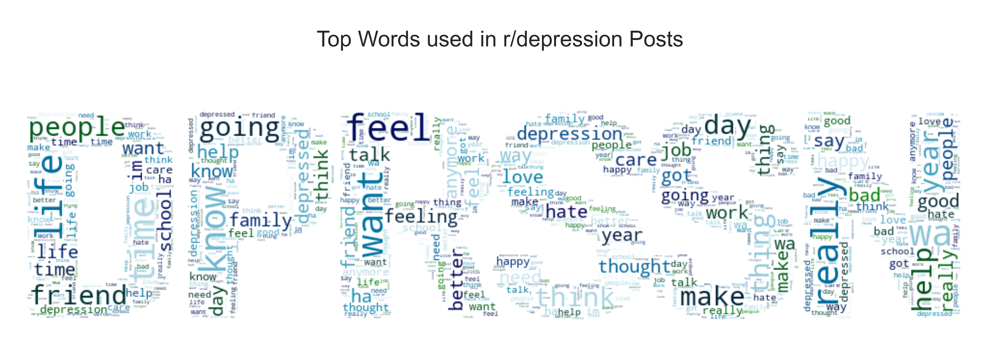

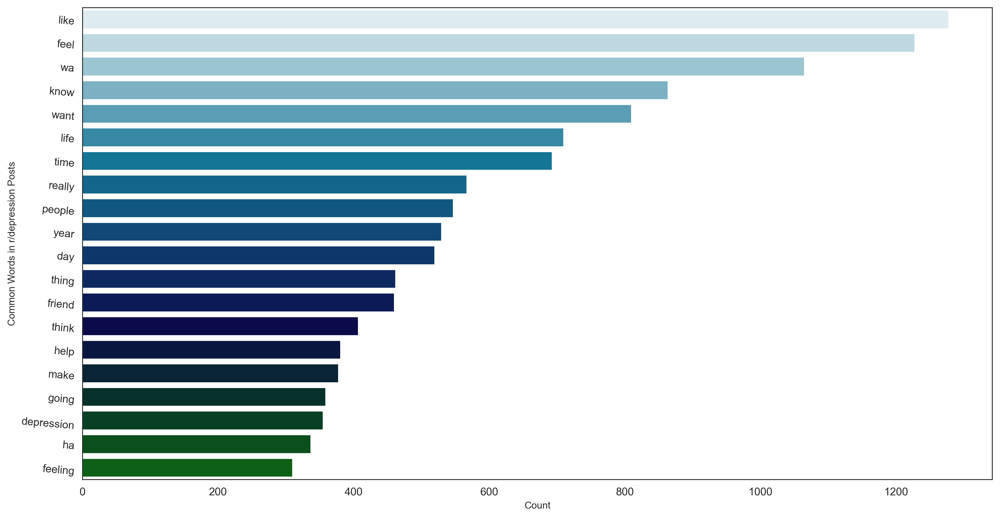

In [42]:
#CALLING THE FUNCTION ON r/depression POSTS
#WE'LL USE DIFFERENT PALETTES TO SEPERATE THE TWO REDDITS: 
#THE PENSIVE "ocean_r" FOR r/depression AND THE HEAVY AND DARK SHADES OF "magma" FOR FOR r/SuicideWatch 
plot_most_used_words("r/depression Posts", depression_posts, palette="ocean_r", image_mask="../assets/depression_mask.png")

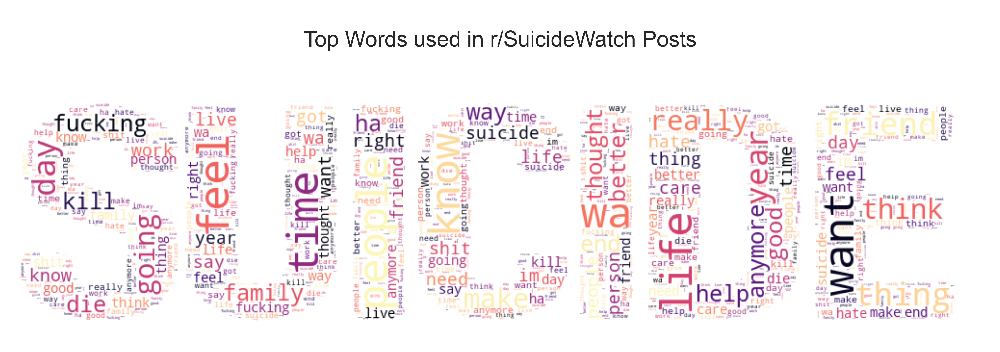

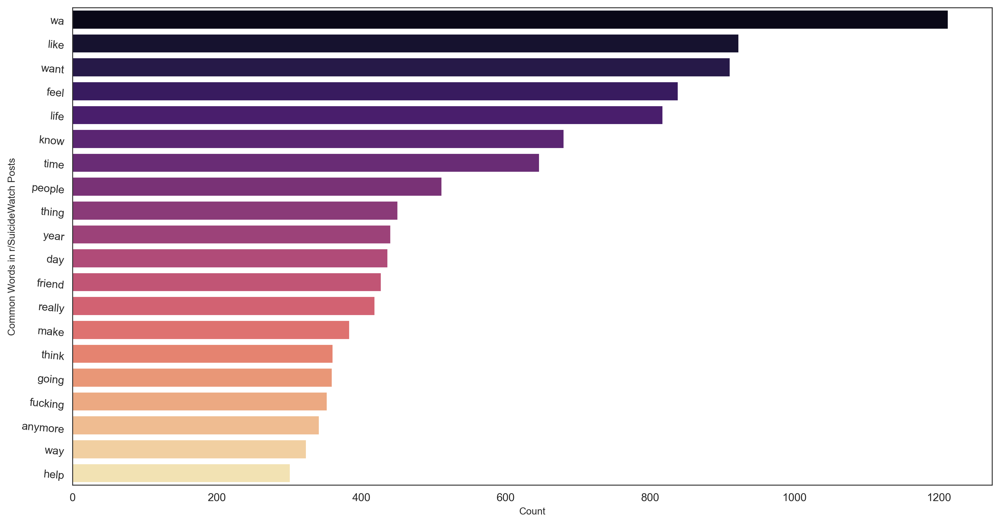

In [43]:
#CALLING THE FUNCTION ON r/SuicideWatch POSTS
plot_most_used_words("r/SuicideWatch Posts", suicide_posts, palette="magma", image_mask="../assets/suicide_mask.png")

#### Reviewing "Top Words" in posts
> **Many similar words** - We see a massive amount of similar words in our "top 20 words" from both subreddits like: wa, want, like, feel, life and people. This might make it difficult four our model. 

> **Unique words from r/depression** - "depression"

> **Unique words from r/SuicideWatch** - "anymore"

### 2.3.2 Top Words (subreddit Titles)
We will visualise the most-used words the our respective subreddit titles in a word cloud and a barplot. 

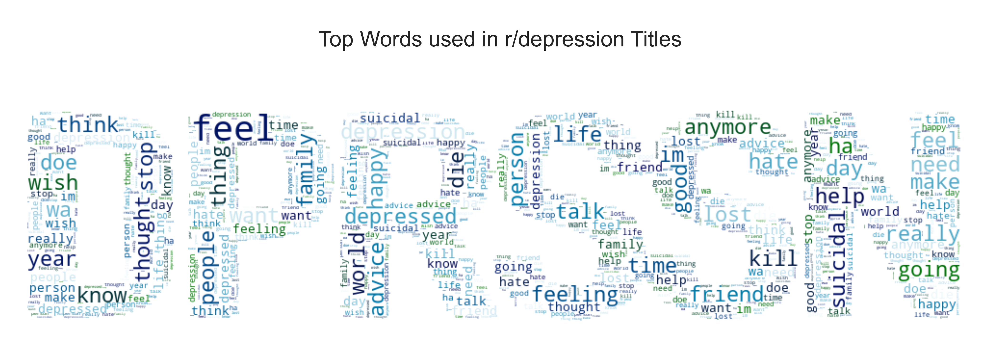

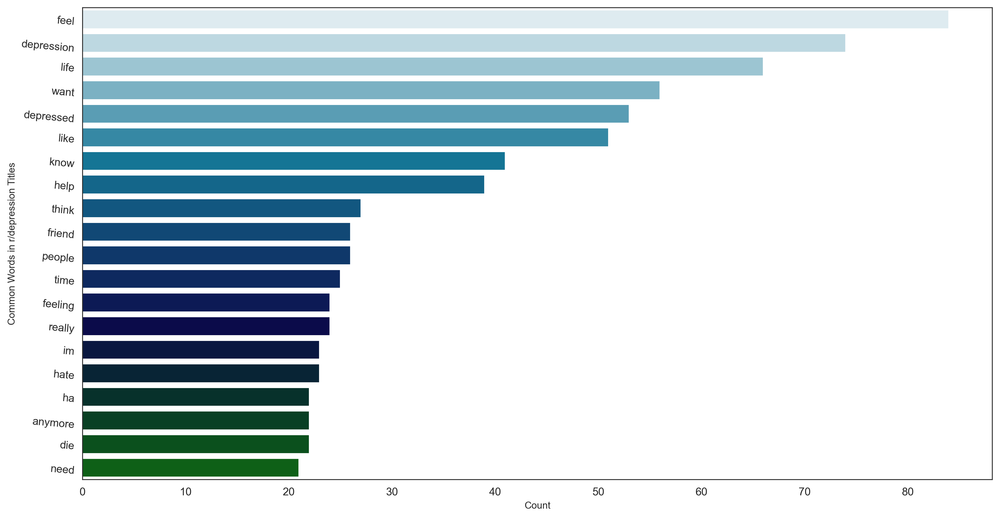

In [44]:
#CALLING THE FUNCTION ON r/depression TITLES
plot_most_used_words("r/depression Titles", depression_titles, palette="ocean_r", image_mask="../assets/depression_mask.png")

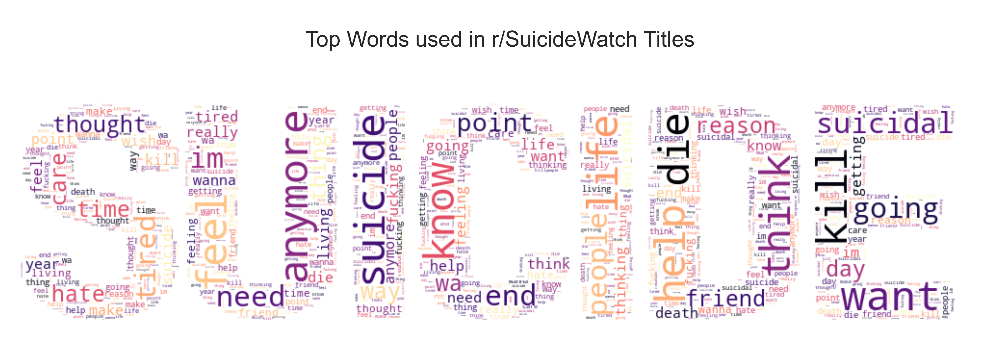

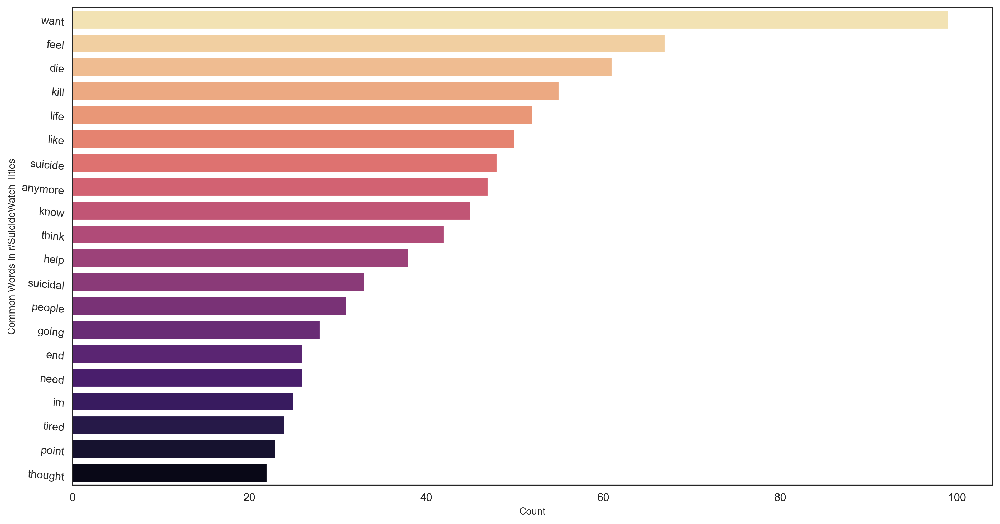

In [45]:
#CALLING THE FUNCTION ON r/SuicideWatch TITLES
plot_most_used_words("r/SuicideWatch Titles", suicide_titles, palette="magma_r", image_mask="../assets/suicide_mask.png")

#### Reviewing "Top Words" in titles
> **Titles a better differentiator?** - We still see a fair amount of similar words in our "top 20 words" in our titles, but much less than in Posts. As Titles in the two subreddits seem to differ more than Posts, it might serve as a better place for our models to hunt for features.

> **Unique words from r/depression titles** - "depression", "depressed", "hate"

> **Unique words from r/SuicideWatch titles** - "die", "kill", "suicidal", "live", "year"

> **The difference between Wanting and Feeling** - It is interesting to note that the top word in r/SuicideWatch is the word "want" and it is used more than twice compared to the word "feel". In r/depression, the top word is "feel" and similarly, is used close to twice the amount of times compared to "want". This trend is also reflected in our visualisations for posts. 

### 2.3.3 Top Words (subreddit Usernames)
We will visualise our most-used words in the respective subreddit usernames in a word cloud and a barplot. The choice of exploring usernames is an odd one as usernames are really short and it'll be really surprising if we can find something revealing in a sample pool of 1897 usernames. Let's try any way!

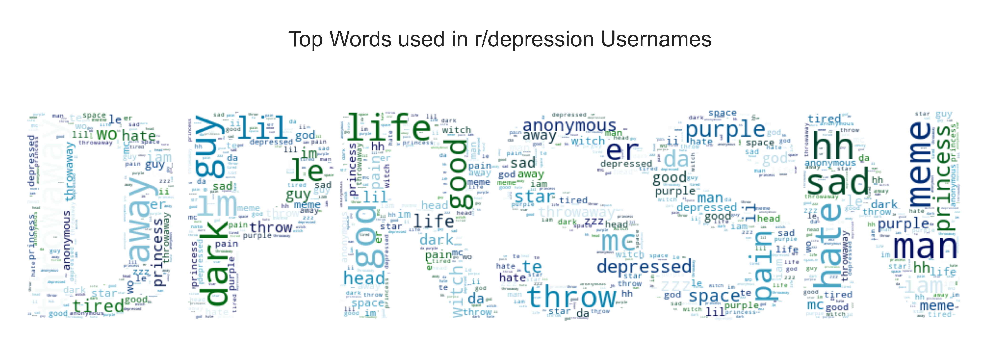

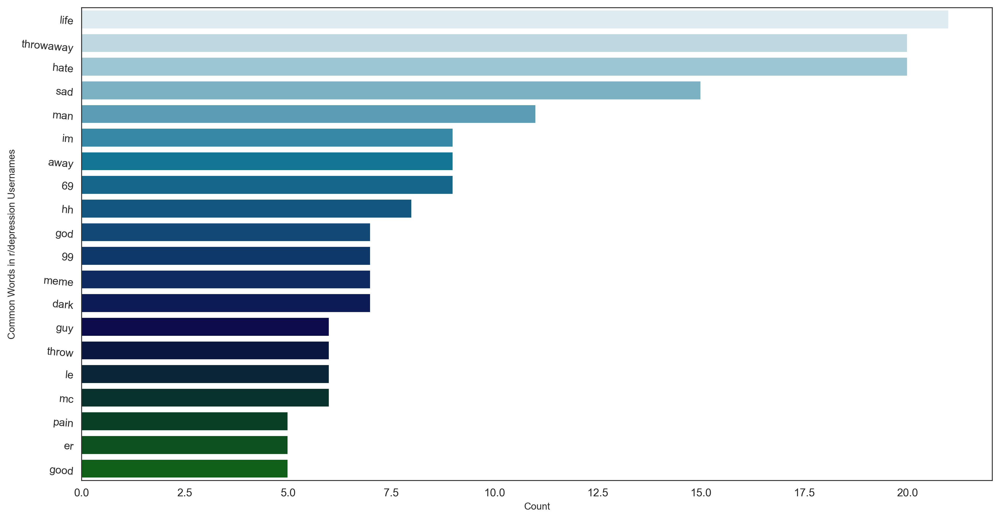

In [46]:
#CALLING THE FUNCTION ON r/depression USERNAMES
plot_most_used_words("r/depression Usernames", depression_authors, palette="ocean_r", image_mask="../assets/depression_mask.png")

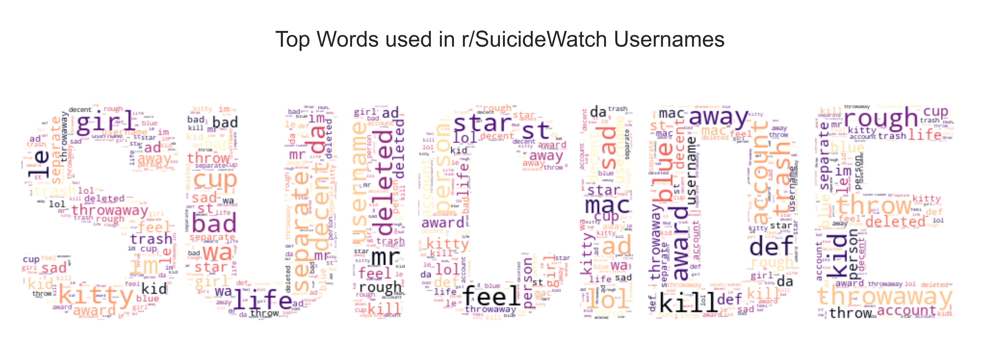

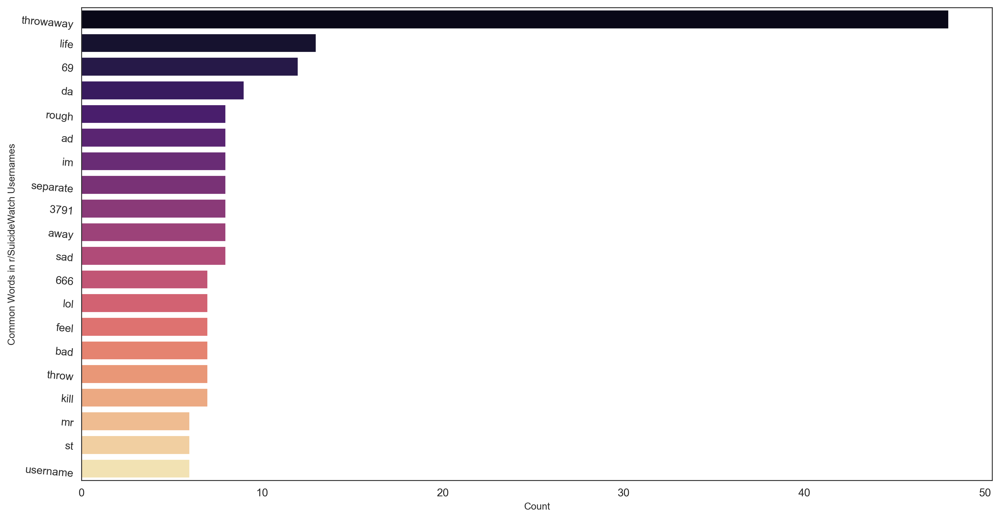

In [47]:
#CALLING THE FUNCTION ON r/SuicideWatch USERNAMES
plot_most_used_words("r/SuicideWatch Usernames", suicide_authors, palette="magma", image_mask="../assets/suicide_mask.png")

In [48]:
#CHECKING ON THE OCCURENCES OF "throwaway" IN USERNAMES
combined_data["author_clean"].str.contains("throwaway").sum()

68

In [49]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN r/depression USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
depression_authors.str.contains('|'.join(search_values)).sum()

35

In [50]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN r/SuicideWatch USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
suicide_authors.str.contains('|'.join(search_values)).sum()

36

In [51]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN ALL USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
combined_data["author_clean"].str.contains('|'.join(search_values)).sum()

71

In [52]:
#CHECKING ON THE OCCURENCES OF FEMALE-SIGNIFIERS IN ALL USERNAMES
search_values = ["ms", "woman", "girl", "gal", "lady"]
combined_data["author_clean"].str.contains('|'.join(search_values)).sum()

16

In [53]:
#CHECKING ON THE OCCURENCES OF "girl" IN IN r/SuicideWatch USERNAMES
suicide_authors[suicide_authors.str.contains("girl")]

1133        rotting loser girl
1456           unusual girl 13
1509                   girl 30
1542                   girl 30
1750            sad gypsy girl
1909    magical capricorn girl
Name: author_clean, dtype: object

In [54]:
#CHECKING OUT WHETHER THE OCCURENCES OF NUMBERS IS UNIQUE TO r/depression
depression_authors[depression_authors.str.contains(r"\d")].count()

344

In [55]:
#CHECKING OUT WHETHER THE OCCURENCES OF NUMBERS IS UNIQUE TO r/depression
#THE ANSWER IS NO. IN FACT, r/SuicideWatch HAS MORE USERNAMES WITH NUMBERS IN THEM
suicide_authors[suicide_authors.str.contains(r"\d")].count()

432

In [56]:
#420, OR FOUR-TWENTY IS SLANG FOR CANNABIS CONSUMPTION.
#CHECKING OUT USER NAMES WITH 420 IN THEM 
combined_data["author_clean"][combined_data["author_clean"].str.contains(r"420")]

100       exotic patient 420
345        throw 69 away 420
432        advanced meme 420
478        username 20242024
487       epic gay mer 64209
621     x throw x away x 420
839             shrek 666420
1383       mr bacon kush 420
1739             dat boi 420
1826    thro away 4206942069
1858         420 thro away z
Name: author_clean, dtype: object

In [57]:
len(combined_data["author_clean"])

1938

#### Reviewing "Top Words" in Usernames

> **Throwaways Dominate** - There are 67 accounts(out of 1897) with the word "throwaway" in it. Throwaway accounts are temporary accounts used by users who want to maintain some anonymity. This is understandable given the subject matter of mental health. 

> **Male-signifiers** - Our top 20 list for depression is dominated by usernames with "mr", "man", "boy", "guy" in them. A check in on our full list of authornames revealed that there are more male-related names(68) than female ones(15). Its not a strong link our finding, but it is worth noting that there is a gender paradox in suicide studies, which observes the phenomenon of women having more suicidal thoughts while men commit suicide more frequently. 

> **Marijuana** - The 420, or "four-twenty", cannabis code made its way into our top 20 for depression. It might be worthwhile to look for links to drug-use in our posts. 

> **Usefulness of Usernames?** - Although our discoveries in Usernames are interesting, the "Top Words" occur in an average of 5 usernames. This might give our model some trouble. "Title" is still my top choice as the column to use to search for features. 

### 2.3.4 Significant Authors 
As an attempt to understand the community in the pages, we will attempt check out users who post often and users who has posted on both subreddits.

In [58]:
#LOOKING AT AUTHORS WITH THE MOST POSTS
combined_data["author"].value_counts().head(20)

hateoflife              17
Separate_Rough_3791      8
[deleted]                6
Jdefon                   5
badpersonaward           5
RylieSmash516_MK2        5
kill3rkitty45            5
wookwo                   4
SQLwitch                 4
ronn69                   4
Decent-Direction1829     4
PeaStraw                 4
Serious-Cup1291          4
zeyad751                 3
Laubabaszch              3
C_mac16                  3
ifeelsoi                 3
YouCantHelpMeButThx      3
schizo_rambo             3
WowOrIsAnd               3
Name: author, dtype: int64

In [59]:
#READING THE POSTS BY AUTHORS WITH THE MOST POSTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin(['Vivid-Smile', 'throaway8297338', 'snakesnack148', 'outakuslayer69',
       'enk9898', 'SQLwitch'])].sort_values("author")

,is_suicide,author,title,selftext
0,0,SQLwitch,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a..."
1,0,SQLwitch,"Regular Check-In Post. Plus, a reminder about the No-Activism Rule.","Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\nWe try our best to keep this space as safe and supportive as possible on reddit's wide-open anonymity-friendly platform. The community rules can be found in the sidebar, or under ""Community Info"" in the official mobile apps. If you aren't sure about a rule, please ask us. \n\n********\n\nPlease keep in mind that no activism, i.e. advocating or fundraising for social change or raising awareness of social issues, is ever allowed here. It's not that we're against activism. We're strongly in favour of it. But we've learned the hard way that it doesn't work within a dedicated support space, so with regret, we..."
950,1,SQLwitch,"New wiki on how to avoid accidentally encouraging suicide, and how to spot covert incitement","We've been seeing a worrying increase in pro-suicide content showing up here and, and also going unreported. This undermines our purpose here, so we wanted to highlight and clarify our guidelines about both direct and indirect incitement of suicide. \n\nWe've created a wiki that covers these issues. We hope this will be helpful to anyone who's wondering whether something's okay here and which responses to report. It explains in detail why *any* validation of suicidal intent, even an ""innocent"" message like ""if you're 100% committed, I'll just wish you peace"" is likely to increase people's pain, and why it's important to report even subtle pro-suicide comments. The full text of the wiki's current version is below, and it is maintained at [/r/SuicideWatch/wiki/incitement](http://www.reddit.com/r/SuicideWatch/wiki/incitement). \n\nWe deeply appreciate everyone who gives responsive, empathetic, non-judgemental support to our OPs, and we particularly thank everyone who's already been..."
951,1,SQLwitch,Please remember that NO ACTIVISM of any kind is allowed here. Not today or any day.,"Activism, i.e. advocating or fundraising for social change or raising awareness of social issues (and suicide *is*, inescapably, a social issue) is absolutely against the rules here at all times. \n\nPlease understand that we're all for well-informed, strategically-savvy activism. It's essential in the fight against stigma, misinformation, and discrimination, and the fight for research, treatment, accommodation, acceptance, and understanding. Most of us, one way or another, are mental-health activists IR

In [60]:
#READING THE POSTS BY AUTHORS WITH DELETED NAMES/ACCOUNTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin(["[deleted]"])].sort_values("author")

,is_suicide,author,title,selftext
512,0,[deleted],Theres a gun show this weekend,"ive been suicidal for awhile now. but recently its only gotten worse. whats the point of living if i have to carry these traumas for the rest of my life ? whats the point if everyone blames me for my pain ? my mom told me i shouldve killed myself when i had the chance. i have the chance now.\nwhen the chances fall into your lap like that, youve gotta recognize them for what they really are--- right ?"
1253,1,[deleted],Is a week enough,"the tldr is pretty much in the title.\n\nI’m planning to kill myself a week from tomorrow and I only made the plan yesterday, though I have been considering it for a few months. The thing is, I don’t really know what I feel. And that sounds vague and cringy but I can’t tell if it’s depression or just... doom? I don’t want to commit suicide for attention -and the thought I am makes me want to kms even more- but am I just making it up? Is a week enough time to plan my death? My family lost has lost a lot of people in December so I figure I should keep it in November. But should I ask for help? Cut my thighs instead? I don’t want to end up with paralyzed hands or permanent liver damage so I wouldn’t do anything NEAR lethal but not deadly. I don’t really want to go to a psych ward. I can laugh and smile and stuff but am planning to kill myself. I don’t even really know if I feel “sadness.” Is this enough to say something??? Is this just some fixation I found? Am I actually just “edgy” ..."
1390,1,[deleted],This is it. I’m sorry for everything.,"Alt account because of a certain person on my main. 15f. \n\nI ran away from home. My parents are nice people. Mum if you ever see this which you probably won’t i’m really fkn sorry. You are awsome and so is dad. \n\nI’m about to jump. But i need to know will 200ft be enough to kill me? \nEverything hurts. \nI even get bullied for my fkn hight. I’m 4ft 11in tall. Yes that is tiny af but still. Literally everything i fkn do, i get bullied for. They even tell me to fucking kill myself. I literally can’t do this. It’s really fkn cold anyways outside.\nIt’s like 3 degrees and i haven’t even brought any form of warm clothing. I’m sitting on a rock crying alot. I made a note and it’s in my pocket telling my best friend that i love her and she is the bedt person in the world to me. I bascially give everything to her when i die. She deserves it. She is the only person that has been nice to me.\nI’m sorry."
1516,1,[deleted],To think that people used to tell me I had a bright future.,"I keep on mentally flipping back the pages of my memory. To the times when I still retained my childhood innocence and had hope that things would turn out alright. How people would praise me so: how excellent of a student I was, how kind of a person I was, how successful my future self would become... If only they could see the failure I am now. \n\nEven though I've lost touch with many of the people back then, I can still envision the faces they'd give me. Mostly of disappointment, some of a condescending pity that wordlessly tells me, ""at least I'm not you."" I know they wouldn't do that. But my brain still taunts me with my own imagination. \n\nIt's sickening. I'm so pathetic. I should be grateful that I'm better off than most despite the pandemic and the many troubles the world is facing right now, shouldn't I? Yet I'm still failing classes that were once easy to me, I'm still becoming bitter and envious of the rightful successes of my hard-working friends, I'm still biting my l..."
1520,1,[deleted],I want to die,"I want to kill myself. I've been thinking about it nonstop for weeks. A lot more recently, I have started doing research and I feel like I'm really warming up to the idea. I have lost the motivation to do anything. The other night, I went for a walk because I wanted to throw myself in front of a car. I learned how to tie a noose. I'm also considering trying to cut my radial artery and bleed to

In [61]:
#ISOLATING AUTHORS WHO HAVE POSTED MORE THAN ONCE
df_author_counts=(pd.DataFrame(combined_data["author"].value_counts()))
df_author_counts.reset_index(level=0, inplace=True)
authors_posting_more_than_once = list(df_author_counts[df_author_counts["author"]>1]["index"])
authors_posting_more_than_once

['hateoflife',
 'Separate_Rough_3791',
 '[deleted]',
 'Jdefon',
 'badpersonaward',
 'RylieSmash516_MK2',
 'kill3rkitty45',
 'wookwo',
 'SQLwitch',
 'ronn69',
 'Decent-Direction1829',
 'PeaStraw',
 'Serious-Cup1291',
 'zeyad751',
 'Laubabaszch',
 'C_mac16',
 'ifeelsoi',
 'YouCantHelpMeButThx',
 'schizo_rambo',
 'WowOrIsAnd',
 'Gengar8802',
 'Santafemyoldfriend',
 'Sirene_Afton',
 'novemberusername',
 'strike-your-fancy',
 'ABCs1713',
 '_At0msk_',
 'Great_Requirement_54',
 'Coleymoley96',
 'god_of_lonelines_UwU',
 'PrudentCarpenter2389',
 'Depressedbadger97',
 'HowIFeel7',
 'trashpandaforlife666',
 'Darkstarkhaz',
 'TechnicalScore9',
 'WetinChiangMai',
 'wa2019',
 'hookrapids',
 'No-Tiger0805',
 'Vapo3030',
 'flutter_dash_roze',
 'CreditAnxious',
 'throwaway_angst',
 'anon8152',
 'xxxCrypt',
 'TheDankYasuo',
 'meeseekstodie137',
 'siberia27',
 'agingsucks98',
 'jjungkooks',
 'Purple_Jr',
 'ScienceNerd771',
 'NightAlternate',
 'otoolealex',
 '_-_DarkLolabuy_-_',
 'Ghiblipuff7',
 'AdGenera

In [62]:
#USING MASKS AND SLICES TO FISH OUT AUTHORS WHO HAVE POSTED IN BOTH subreddits
pd.set_option("display.max_colwidth", 100)
#CREATING A DATAFRAME WITH MEAN VALUES OF is_suicide
#A MEAN VALUE THAT IS NOT ONE OR ZERO WOULD INDICATE THAT THEY POST IN BOTH subreddits
more_than_once_mean_df = combined_data[combined_data["author"].isin(authors_posting_more_than_once)].groupby("author").mean()
more_than_once_mean_df.reset_index(level=0, inplace=True)
#CREATING MASK TO ISOLATE REDDITORS WHO HAVE POSTED IN BOTH FORUMS
double_posters_mask_0 = ((more_than_once_mean_df["is_suicide"]) !=0) 
double_posters_mask_1 = ((more_than_once_mean_df["is_suicide"]) !=1.0) 
#TRYING TO FIND OUT HOW MANY DOUBLE POSTERS THERE ARE
double_posters = more_than_once_mean_df[double_posters_mask_0][double_posters_mask_1].sort_values("num_comments", ascending=False)
print(len(double_posters))
#CREATING LIST OF TOP 7 DOUBLE POSTERS BY COMMENTS
top_double_posters_list= list(double_posters["author"].head(7))
top_double_posters_list

32


E:\Anaconda\envs\Bling\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # This is added back by InteractiveShellApp.init_path()


['SQLwitch',
 'PeaStraw',
 'GarryGrumbeld',
 'novemberusername',
 'SupremeSaleem',
 'agingsucks98',
 'wookwo']

In [63]:
#THERE ARE 27 REDDITORS WHO HAVE POSTED ON BOTH FORUMS BEFORE
#WE CAN'T LOOK AT ALL THE POSTS BUT LETS LOOK AT THE TOP 7 WHO HAVE RECEIVED THE MOST COMMENTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext","url"]][combined_data["author"].isin(top_double_posters_list)].sort_values("author")
    

,is_suicide,author,title,selftext,url
1441,1,GarryGrumbeld,I'm a Incel and i'll kill myself next year...,"I am 18 years old, I am lonely (I have no friends and I have no desire to have), I am ugly, antisocial, sad and totally unprepared for life. I have no interest in living and I plan my death for next year (or the year after). The only thing that prevents me is my mother, she tried so hard to help me after she learned that I have depression. He bought me medicine, paid for a consultation, a psychologist and even today he tries to talk to me and cheer me up. But it all just makes me give up killing myself momentarily just because of the guilt it brings me, and it doesn't take long for me to feel depressed again. I just want to die in peace without feeling all that weight on my conscience.",https://www.reddit.com/r/SuicideWatch/comments/jxux60/im_a_incel_and_ill_kill_myself_next_year/
476,0,GarryGrumbeld,I'm a Incel and i'll kill myself next year ...,"I am 18 years old, I am lonely (I have no friends and I have no desire to have), I am ugly, antisocial, sad and totally unprepared for life. I have no interest in living and I plan my death for next year (or the year after). The only thing that prevents me is my mother, she tried so hard to help me after she learned that I have depression. He bought me medicine, paid for a consultation, a psychologist and even today he tries to talk to me and cheer me up. But it all just makes me give up killing myself momentarily just because of the guilt it brings me, and it doesn't take long for me to feel depressed again. I just want to die in peace without feeling all that weight on my conscience.",https://www.reddit.com/r/depression/comments/jy669a/im_a_incel_and_ill_kill_myself_next_year/
18,0,PeaStraw,We are all just here to die.,We are all just here to fuck. Reproduce. And then die on a floating rock in space.,https://www.reddit.com/r/depression/comments/jyrc5j/we_are_all_just_here_to_die/
19,0,PeaStraw,I'm crying.,I just can't handle this anymore. I'm so tired. \n\nI don't want to live anymore. I want to die so bad. But im too scared.. I hate this. I wish i was aborted.,https://www.reddit.com/r/depression/comments/jyr7kp/im_crying/
1103,1,PeaStraw,I'm really contemplating about finally doing it,Tonight might be the night i decide.,https://www.reddit.com/r/SuicideWatch/comments/jyrdk6/im_really_contemplating_about_finally_doing_it/
1066,1,PeaStraw,What is the point of this?,What is the point of living if you are just going to die anyways.\n\nWhy live to see everyone you love die? \n\nIm so close to my mother. So very close and seeing her getting older hurts me. \n\nI don't want to see her die. I don't want ro say goodbye to her. \n\nI want to die first. Why do we have to exist? Why are we conscious? To just feel this pain? \n\nWhat is the point of it. There is nothing. No matter what you do or what you have it will never replace the people you love that will pass. So what does any of this matter? \n\nI want to die so badly and im so scared to all at once because of my stupid body. \n\nI don't want to see the end of my life all alone without my mother or anyone else i love. In the youngest of all my siblings. \n\nAnd i just want to kill myself but i can't. Im just so tired of existing. I just wish i could snap put of existence and forget this all. But it's just painful. \n\n\nThis is just agony.,https://www.reddit.com/r/SuicideWatch/comments/jyr61b/what_is_the_point_of_this/
0,0,SQLwitch,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goo

#### Reviewing Significant Authors

> **The Moderator** - The redditor SQLWitch seems to be a moderating presence in both subreddits. Appearing a couple of times to remind redditors about rules like non-activism and not posting pro-suicide posts. SQLWitch's posts hints at the culture both communities, which are similar help-seeking, problem-airing forums. 

> **Double-Posting** - Aside from SQLWitch, there are more than 26 other users who have posted on both forums. For example, u/thathumbletrashcan posted on r/depression on March 4th that "*I don't want to die, but I don't want to live anymore*" . A day later, u/thathumbletrashcan visits the r/SuicideWatch forum and posts "*I've finally given in. This is it I guess, I've finally grown the balls to fulfil my plan......all of you won't have to deal with me again*." It seems that users treat r/SuicideWatch as a "late-stage" forum or a place to bid farewell to their fellow help-seekers. It might be useful to dig into the language used by these users prior to their "farewells" as the "shift" in their choice of words is exactly what we're looking for.  

### 2.3.5 Length of posts
We have already noticed a significant number of posts with no words in r/SuicideWatch posts. We should dive in to check out what the number of words are in an average post in each subreddit.  

In [64]:
combined_data["selftext_length"]= [len(combined_data["selftext"][i]) for i in range(len(combined_data))]

In [65]:
combined_data["title_length"]= [len(combined_data["title"][i]) for i in range(len(combined_data))]

In [66]:
ave_length_dep_title = combined_data["title_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_title = combined_data["title_length"][combined_data["is_suicide"] ==1].mean()
ave_length_dep_post = combined_data["selftext_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_post = combined_data["selftext_length"][combined_data["is_suicide"] ==1].mean()

print("Average length of a r/depression title: {}".format(ave_length_dep_title))
print("Average length of a r/SuicideWatch title: {}".format(ave_length_sui_title))
print("Average length of a r/depression post: {}".format(ave_length_dep_post))
print("Average length of a r/SuicideWatch post: {}".format(ave_length_sui_post))

Average length of a r/depression title: 39.54842105263158
Average length of a r/SuicideWatch title: 41.337044534412954
Average length of a r/depression post: 919.9831578947368
Average length of a r/SuicideWatch post: 837.6953441295547


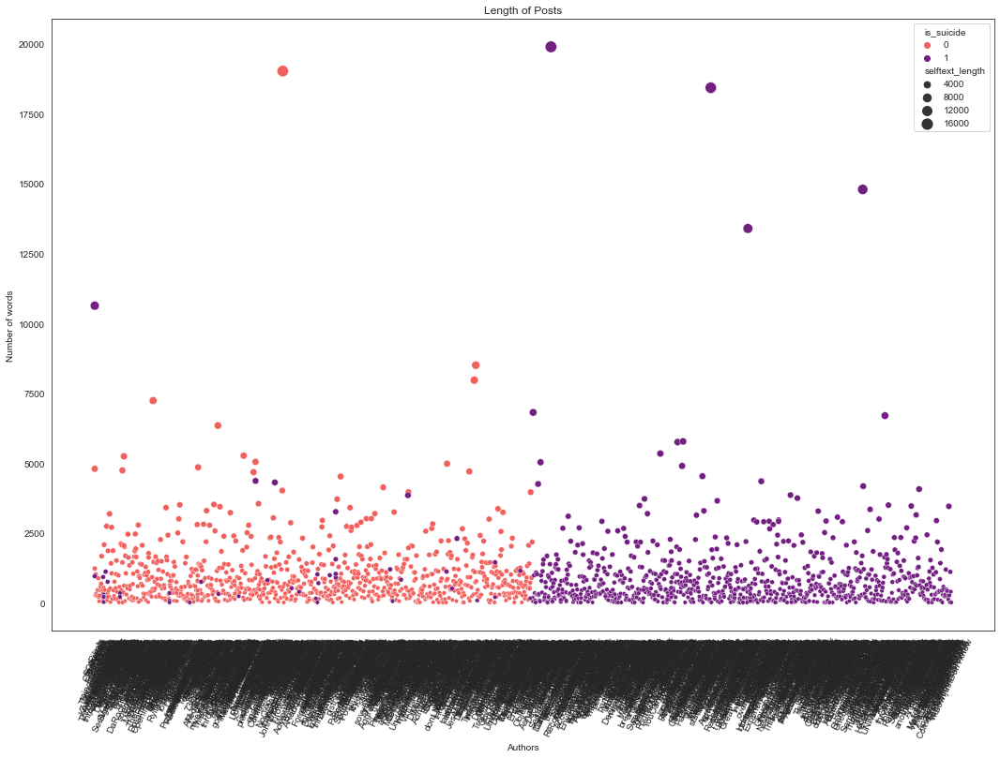

In [67]:
#CREATING A SCATTERPLOT TO VISUALISE LENGTH OF POSTS
sns.set_style("white")
plt.figure(figsize = (18, 12))
sns.scatterplot(data =combined_data,
               y = "selftext_length", 
               x = "author",
               hue = 'is_suicide', 
               palette = "magma_r",
               size = 'selftext_length',
               sizes=(20, 150));
plt.title("Length of Posts");
plt.xlabel("Authors");
plt.ylabel("Number of words");
plt.xticks(rotation=65);

#### Reviewing Length of Posts

> **Longer r/depression posts** - The average length of r/depression posts is almost 130 words shorter than that of r/SuicideWatch. Although, as we can see from our scatterplot above, this figures might be skewed by some extremely long posts and the presence of empty posts in r/SuicideWatch. 



### 2.3.6 Using Scattertext to visualise our corpus
As a final step in our EDA, we will use Scattertext to produce a user-friendly way of visualising our corpus in HTML.

In [68]:
#CREATING A megatext COLUMN
combined_data["megatext_clean"]=combined_data["author_clean"] + " " + combined_data["selftext_clean"]+ " " +combined_data["title_clean"]

In [69]:
#CREATING A DATAFRAME FOR SCATTERTEXT
scatter_data = combined_data[["megatext_clean", "is_suicide"]]
scatter_data["category"] = scatter_data["is_suicide"].map({0: "Depression", 1: "Suicide"})
scatter_data.tail()

,megatext_clean,is_suicide,category
1933,god wtf shit one ha time everyone ha something better someone better talk broke toxic relationship feeling suicidal ever reason id rather feel hurt angry overwhelmed nothing one care,1,Suicide
1934,eagle cousin brownie government hey wanted say fucking garbage,1,Suicide
1935,hail 20192020 happened couple day ago seriously make angry wa talking dad hinted year ago might depressed suicidal never really said anything day ago dad kind person say wake early exercise think healthy problem go away fine method long story saturday wa little far low wa visible dad walked room saw sat talked school went weather pleasant enjoy fine said look point thinking useless think useful useful help much internally lost like shit never thought like holy fuck bad advice another level oh fucking god okay done ranting thank reading hope good day sad point sad tf tf,1,Suicide
1936,huntress lone wolf ive already tried failed 4 time year making plan another quite thought attempt instead failed last minute one im getting urge overdose tomorrow know ha low success rate im sure get without incident quite stock medication otc prescription think stop urge strong,1,Suicide
1937,know dont know emptypost painless way,1,Suicide


In [70]:
#PARSING TEXT FOR SCATTERTEXT
nlp = st.whitespace_nlp_with_sentences
scatter_data.groupby("category").apply(lambda x: x.megatext_clean.apply(lambda x: len(x.split())).sum())
scatter_data['parsed'] = scatter_data.megatext_clean.apply(nlp)
scatter_data.tail()

,megatext_clean,is_suicide,category,parsed
1933,god wtf shit one ha time everyone ha something better someone better talk broke toxic relationship feeling suicidal ever reason id rather feel hurt angry overwhelmed nothing one care,1,Suicide,"(god, wtf, shit, one, ha, time, everyone, ha, something, better, someone, better, talk, broke, toxic, relationship, feeling, suicidal, ever, reason, id, rather, feel, hurt, angry, overwhelmed, nothing, one, care)"
1934,eagle cousin brownie government hey wanted say fucking garbage,1,Suicide,"(eagle, cousin, brownie, government, hey, wanted, say, fucking, garbage)"
1935,hail 20192020 happened couple day ago seriously make angry wa talking dad hinted year ago might depressed suicidal never really said anything day ago dad kind person say wake early exercise think healthy problem go away fine method long story saturday wa little far low wa visible dad walked room saw sat talked school went weather pleasant enjoy fine said look point thinking useless think useful useful help much internally lost like shit never thought like holy fuck bad advice another level oh fucking god okay done ranting thank reading hope good day sad point sad tf tf,1,Suicide,"(hail, 20192020, happened, couple, day, ago, seriously, make, angry, wa, talking, dad, hinted, year, ago, might, depressed, suicidal, never, really, said, anything, day, ago, dad, kind, person, say, wake, early, exercise, think, healthy, problem, go, away, fine, method, long, story, saturday, wa, little, far, low, wa, visible, dad, walked, room, saw, sat, talked, school, went, weather, pleasant, enjoy, fine, said, look, point, thinking, useless, think, useful, useful, help, much, internally, lost, like, shit, never, thought, like, holy, fuck, bad, advice, another, level, oh, fucking, god, okay, done, ranting, thank, reading, hope, good, day, sad, point, sad, tf, tf)"
1936,huntress lone wolf ive already tried failed 4 time year making plan another quite thought attempt instead failed last minute one im getting urge overdose tomorrow know ha low success rate im sure get without incident quite stock medication otc prescription think stop urge strong,1,Suicide,"(huntress, lone, wolf, ive, already, tried, failed, 4, time, year, making, plan, another, quite, thought, attempt, instead, failed, last, minute, one, im, getting, urge, overdose, tomorrow, know, ha, low, success, rate, im, sure, get, without, incident, quite, stock, medication, otc, prescription, think, stop, urge, strong)"
1937,know dont know emptypost painless way,1,Suicide,"(know, dont, know, emptypost, painless, way)"


In [71]:
#DEFINING A CORPUS FOR SCATTERTEXT VISUALISATION
corpus = st.CorpusFromParsedDocuments(scatter_data, category_col="category", parsed_col="parsed").build()

In [72]:
#CREATING A SCATTERTEXT PLOT
html = produce_scattertext_explorer(corpus,
                                    category='Depression',
                                    category_name='Depression',
                                    not_category_name='Suicide',
                                    width_in_pixels=1000,
                                    jitter=0.1,
                                    minimum_term_frequency=5,
                                    transform=st.Scalers.percentile,
                                    metadata=scatter_data['category']
                                   )
file_name = '../assets/Reddit_ScattertextRankDataJitter.html'
open(file_name, 'wb').write(html.encode('utf-8'))
IFrame(src=file_name, width = 1200, height=700)

In [73]:
#CHECKING IF OUR NEWER COLUMNS INTRODUCED MISSING DATA INTO OUR DATASET
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1938 entries, 0 to 1937
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   title            1938 non-null   object
 1   selftext         1938 non-null   object
 2   author           1938 non-null   object
 3   num_comments     1938 non-null   int64 
 4   is_suicide       1938 non-null   int64 
 5   url              1938 non-null   object
 6   selftext_clean   1938 non-null   object
 7   title_clean      1938 non-null   object
 8   author_clean     1938 non-null   object
 9   selftext_length  1938 non-null   int64 
 10  title_length     1938 non-null   int64 
 11  megatext_clean   1938 non-null   object
dtypes: int64(4), object(8)
memory usage: 181.8+ KB


#### Save Data

In [74]:
#SAVING combined_data
combined_data.to_csv('../data/data_for_model.csv', index = False)